# Final python notebook Jessica Fay 2 of 2

## In this notebook, I primarly prepare choropleth maps, conduct univarite and bivariate analysis of the study variables and generate our Food Inseucirty Index variable

In [1]:
#import python libraries
import pandas as pd
import geopandas as gpd 

In [2]:
# read in census data to notebook
food=pd.read_csv('Data/finaldata_0303.csv')

In [3]:
food.head(3)

,geoid20_x,CT20,FIPS_census,tract,ShapeSTArea,ShapeSTLength,geometry_x,% Hispanic or Latino,% Not a Citizen,% Unemployed,...,mental_health_pct,chd_pct,snap_rate,spa,calfresh_per_100_families,Percent 65 years and over,lowaccess_count,denom_total_pop,lowaccess_li_count,lowaccess_seniors_count
0,531604,531604,6.037532e+09,6.037532e+09,3947756.523,8092.736172,POLYGON ((-118.15979217068833 34.0256888580665...,99,25,5,...,18,5,9,SPA 7 - East,35,9,0,3580,0,0
1,531604,531604,6.037532e+09,6.037532e+09,3947756.523,8092.736172,POLYGON ((-118.15979217068833 34.0256888580665...,99,25,5,...,18,5,9,SPA 7 - East,35,9,0,3580,0,0
2,533201,533201,6.037533e+09,6.037533e+09,4023505.246,9389.961973,POLYGON ((-118.2126241765933 33.98419884980421...,99,32,13,...,19,4,7,SPA 7 - East,27,12,0,2805,0,0


In [4]:
#confirming correct data types
food.info(verbose=True, show_counts=True)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4910 entries, 0 to 4909
Data columns (total 27 columns):
 #   Column                             Non-Null Count  Dtype  
---  ------                             --------------  -----  
 0   geoid20_x                          4910 non-null   object 
 1   CT20                               4910 non-null   object 
 2   FIPS_census                        4910 non-null   float64
 3   tract                              4910 non-null   float64
 4   ShapeSTArea                        4910 non-null   float64
 5   ShapeSTLength                      4908 non-null   float64
 6   geometry_x                         4906 non-null   object 
 7   % Hispanic or Latino               4910 non-null   int64  
 8   % Not a Citizen                    4910 non-null   int64  
 9   % Unemployed                       4910 non-null   int64  
 10  Population Density (Per Sq. Mile)  4910 non-null   int64  
 11  Median Household Income            4910 non-null   int64

In [5]:
#create low access percent variable
a= food['lowaccess_count']
b=food['denom_total_pop']
food['lowaccess_pct']=round((a/b)*100)

# Clean data and Make data viz

In [8]:
import plotly.express as px
import pandas as pd

In [9]:
#conditionally delete rows where hispanic % is outlier
new = food[food['% Hispanic or Latino'] <= 100]

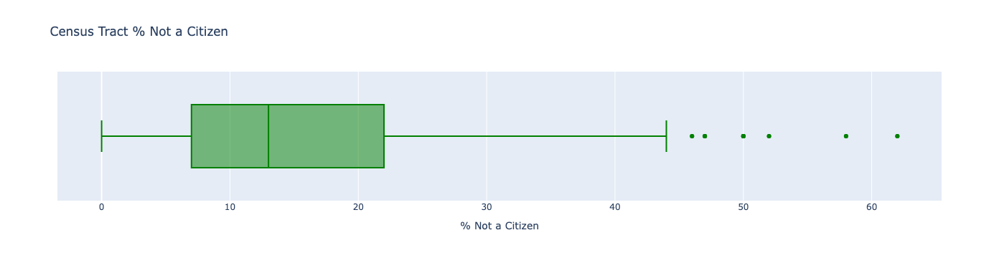

In [62]:
# boxplot of citizenship distribution
px.box(data_frame = new
       ,x = '% Not a Citizen', color_discrete_sequence = ['green'],title='Census Tract % Not a Citizen'
       )

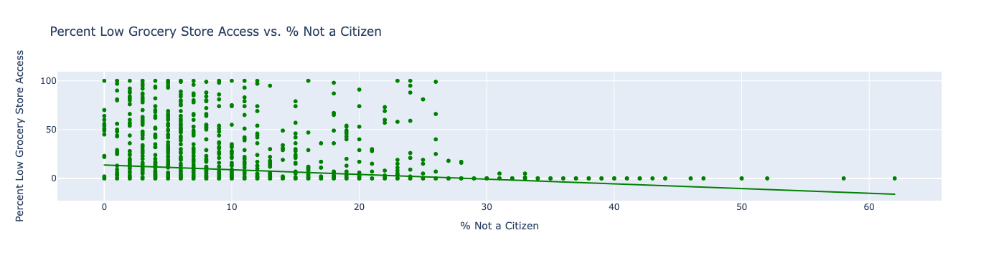

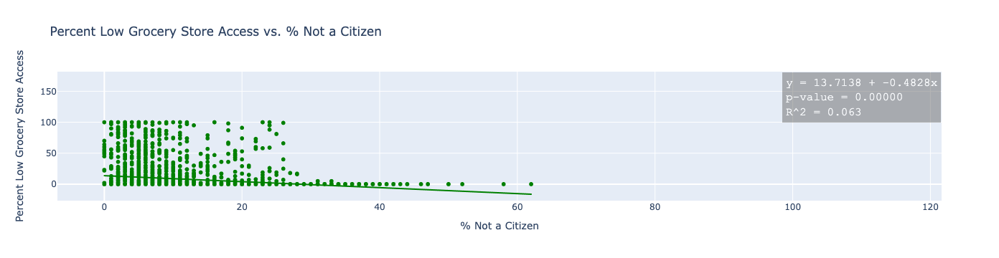

In [9]:
#fit trendline to correlation of citizenship and low grocery store access

fig=px.scatter(new, x= "% Not a Citizen", y="lowaccess_pct", trendline="ols", color_discrete_sequence = ['green'], labels ={
                "% Not a Citizen": "% Not a Citizen",
                "lowaccess_pct": "Percent Low Grocery Store Access"},
            title="Percent Low Grocery Store Access vs. % Not a Citizen")
fig.show()

# retrieve model estimates
model = px.get_trendline_results(fig)
results = model.iloc[0]["px_fit_results"]
alpha = results.params[0]
beta = results.params[1]
p_beta = results.pvalues[1]
r_squared = results.rsquared

line1 = 'y = ' + str(round(alpha, 4)) + ' + ' + str(round(beta, 4))+'x'
line2 = 'p-value = ' + '{:.5f}'.format(p_beta)
line3 = 'R^2 = ' + str(round(r_squared, 3))
summary = line1 + '<br>' + line2 + '<br>' + line3


fig.add_annotation(
        x=110,
        y=140,
        xref="x",
        yref="y",
        text=summary,
        showarrow=False,
        font=dict(
            family="Courier New, monospace",
            size=16,
            color="#ffffff"
            ),
        align="left",
        arrowhead=2,
        arrowsize=1,
        arrowwidth=2,
        arrowcolor="#636363",
        ax=20,
        ay=-30,
        borderwidth=2,
        borderpad=4,
        bgcolor="rgba(100,100,100, 0.6)",
        opacity=0.8
        )

fig.show()

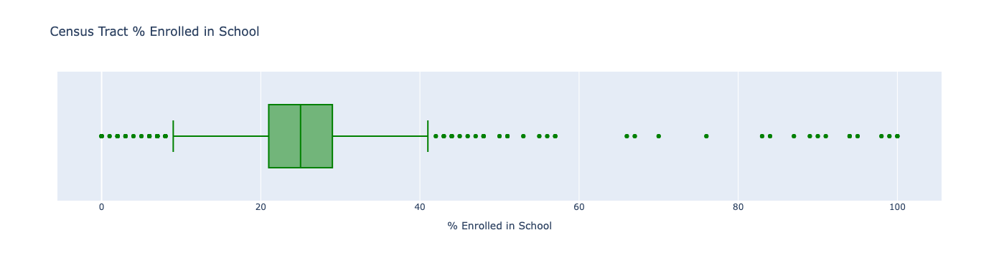

In [56]:
# # boxplot of education distribution
px.box(data_frame = new
       ,x = '% Enrolled in School', color_discrete_sequence = ['green'],title='Census Tract % Enrolled in School'
       )

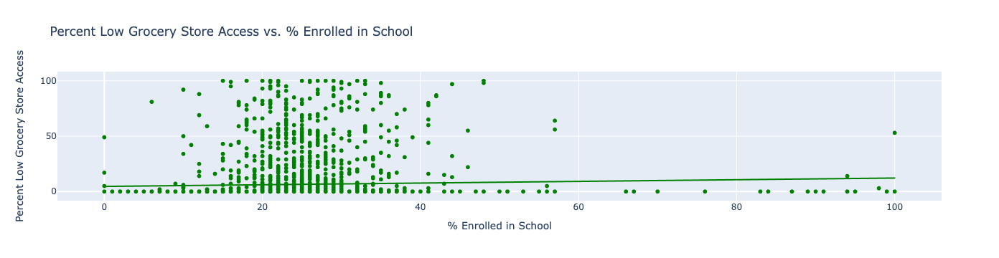

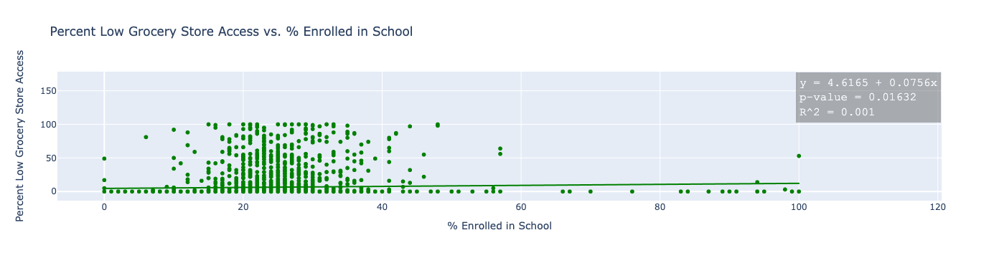

In [58]:
#fit trendline of education and percent low grocery store access correlation

fig=px.scatter(new, x= "% Enrolled in School", y="lowaccess_pct", trendline="ols", color_discrete_sequence = ['green'], labels ={
                "% Enrolled in School": "% Enrolled in School",
                "lowaccess_pct": "Percent Low Grocery Store Access"},
            title="Percent Low Grocery Store Access vs. % Enrolled in School")
fig.show()

# retrieve model estimates
model = px.get_trendline_results(fig)
results = model.iloc[0]["px_fit_results"]
alpha = results.params[0]
beta = results.params[1]
p_beta = results.pvalues[1]
r_squared = results.rsquared

line1 = 'y = ' + str(round(alpha, 4)) + ' + ' + str(round(beta, 4))+'x'
line2 = 'p-value = ' + '{:.5f}'.format(p_beta)
line3 = 'R^2 = ' + str(round(r_squared, 3))
summary = line1 + '<br>' + line2 + '<br>' + line3


fig.add_annotation(
        x=110,
        y=140,
        xref="x",
        yref="y",
        text=summary,
        showarrow=False,
        font=dict(
            family="Courier New, monospace",
            size=16,
            color="#ffffff"
            ),
        align="left",
        arrowhead=2,
        arrowsize=1,
        arrowwidth=2,
        arrowcolor="#636363",
        ax=20,
        ay=-30,
        borderwidth=2,
        borderpad=4,
        bgcolor="rgba(100,100,100, 0.6)",
        opacity=0.8
        )

fig.show()

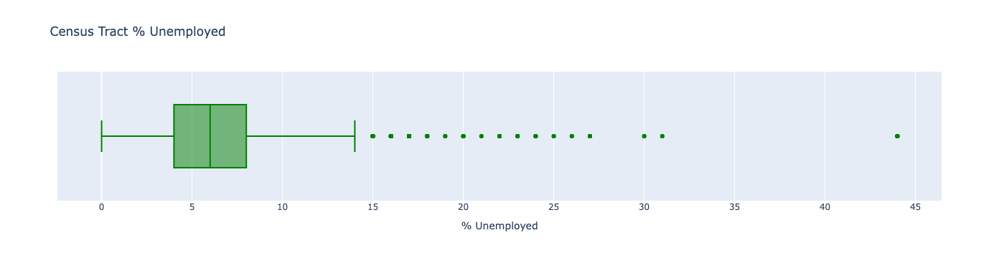

In [51]:
#boxplot of unemployment distribution
px.box(data_frame = new
       ,x = '% Unemployed', color_discrete_sequence = ['green'],title='Census Tract % Unemployed'
       )

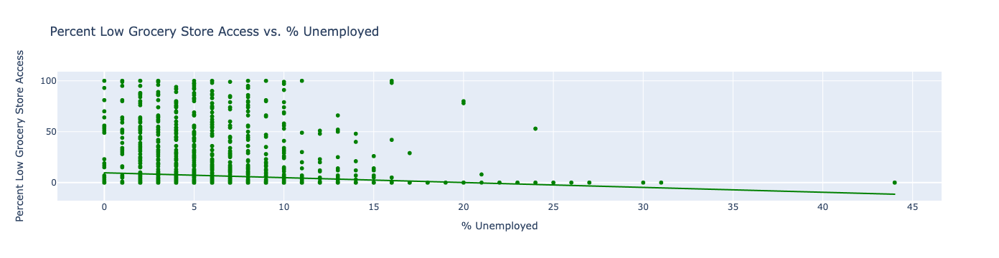

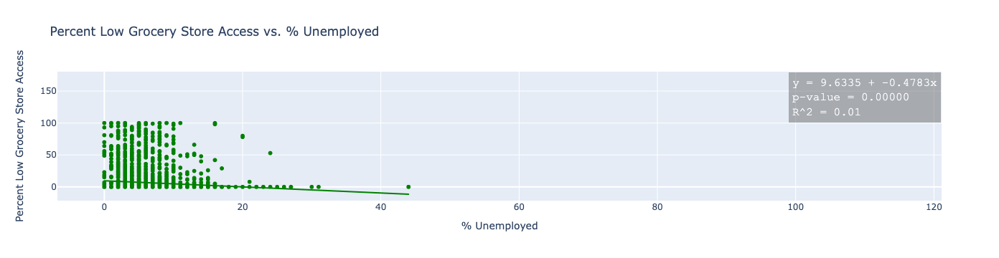

In [54]:
#fit trendline of unemployment and low grocery store access correlation/scatterplot

fig=px.scatter(new, x= "% Unemployed", y="lowaccess_pct", trendline="ols", color_discrete_sequence = ['green'], labels ={
                "% Unemployed": "% Unemployed",
                "lowaccess_pct": "Percent Low Grocery Store Access"},
            title="Percent Low Grocery Store Access vs. % Unemployed")
fig.show()

# retrieve model estimates
model = px.get_trendline_results(fig)
results = model.iloc[0]["px_fit_results"]
alpha = results.params[0]
beta = results.params[1]
p_beta = results.pvalues[1]
r_squared = results.rsquared

line1 = 'y = ' + str(round(alpha, 4)) + ' + ' + str(round(beta, 4))+'x'
line2 = 'p-value = ' + '{:.5f}'.format(p_beta)
line3 = 'R^2 = ' + str(round(r_squared, 3))
summary = line1 + '<br>' + line2 + '<br>' + line3


fig.add_annotation(
        x=110,
        y=140,
        xref="x",
        yref="y",
        text=summary,
        showarrow=False,
        font=dict(
            family="Courier New, monospace",
            size=16,
            color="#ffffff"
            ),
        align="left",
        arrowhead=2,
        arrowsize=1,
        arrowwidth=2,
        arrowcolor="#636363",
        ax=20,
        ay=-30,
        borderwidth=2,
        borderpad=4,
        bgcolor="rgba(100,100,100, 0.6)",
        opacity=0.8
        )

fig.show()

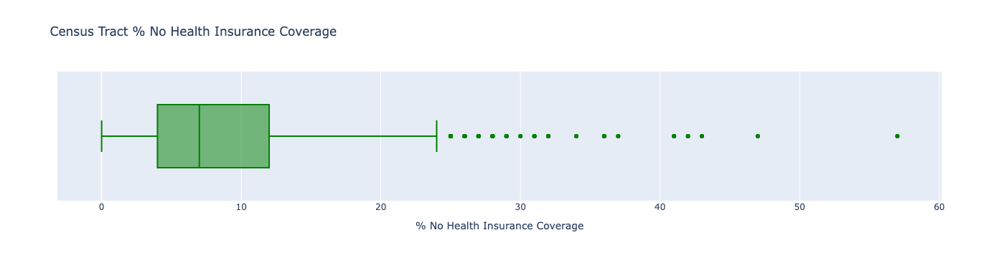

In [47]:
# explore distribution no health insurance coverage
px.box(data_frame = new
       ,x = '% No Health Insurance Coverage', color_discrete_sequence = ['green'],title='Census Tract % No Health Insurance Coverage'
       )

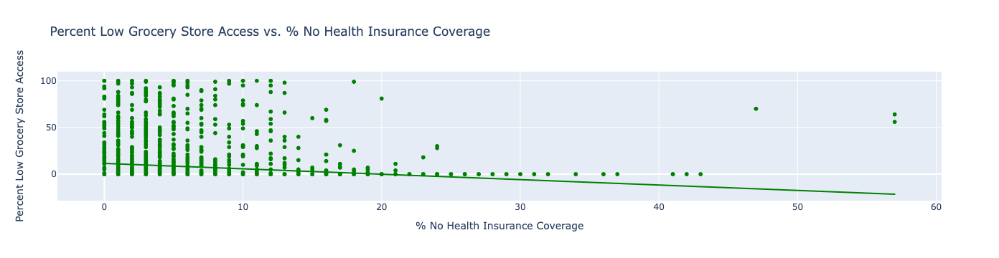

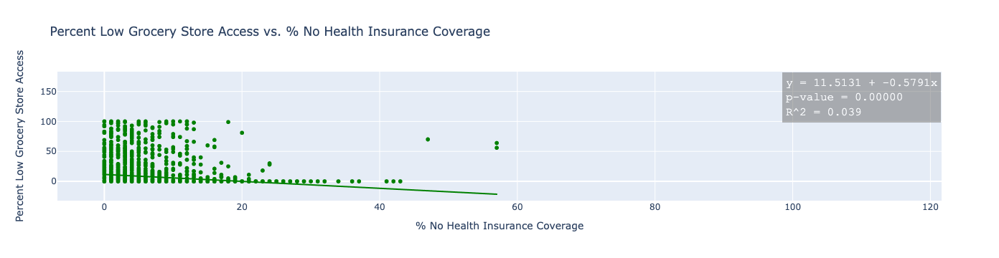

In [48]:
#fit trendline of % no health insurance coverage and low grocery store access correlation/scatterplot

fig=px.scatter(new, x= "% No Health Insurance Coverage", y="lowaccess_pct", trendline="ols", color_discrete_sequence = ['green'], labels ={
                "% No Health Insurance Coverage": "% No Health Insurance Coverage",
                "lowaccess_pct": "Percent Low Grocery Store Access"},
            title="Percent Low Grocery Store Access vs. % No Health Insurance Coverage")
fig.show()

# retrieve model estimates
model = px.get_trendline_results(fig)
results = model.iloc[0]["px_fit_results"]
alpha = results.params[0]
beta = results.params[1]
p_beta = results.pvalues[1]
r_squared = results.rsquared

line1 = 'y = ' + str(round(alpha, 4)) + ' + ' + str(round(beta, 4))+'x'
line2 = 'p-value = ' + '{:.5f}'.format(p_beta)
line3 = 'R^2 = ' + str(round(r_squared, 3))
summary = line1 + '<br>' + line2 + '<br>' + line3


fig.add_annotation(
        x=110,
        y=140,
        xref="x",
        yref="y",
        text=summary,
        showarrow=False,
        font=dict(
            family="Courier New, monospace",
            size=16,
            color="#ffffff"
            ),
        align="left",
        arrowhead=2,
        arrowsize=1,
        arrowwidth=2,
        arrowcolor="#636363",
        ax=20,
        ay=-30,
        borderwidth=2,
        borderpad=4,
        bgcolor="rgba(100,100,100, 0.6)",
        opacity=0.8
        )

fig.show()

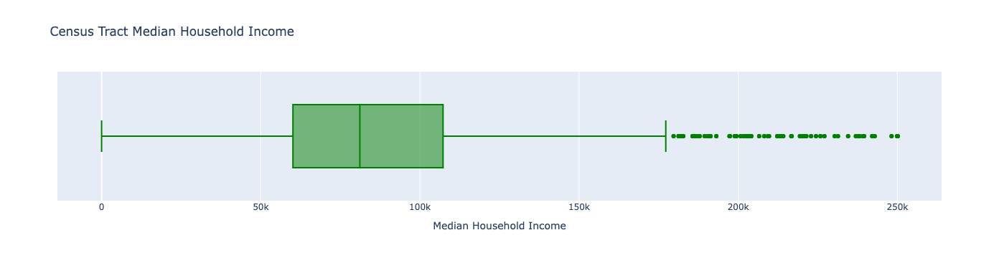

In [14]:
# explore distribution household income
px.box(data_frame = new
       ,x = 'Median Household Income', color_discrete_sequence = ['green'],title='Census Tract Median Household Income'
       )

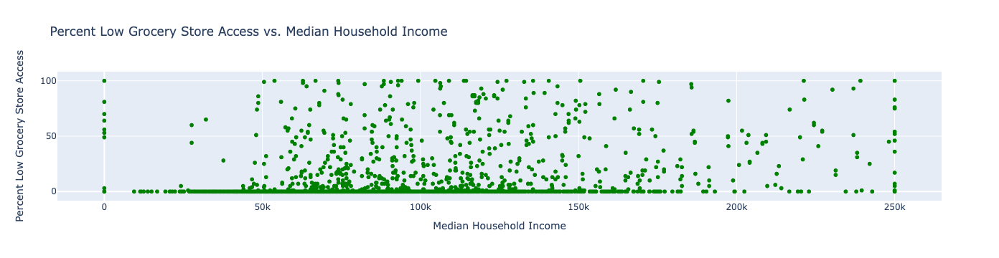

In [15]:
#correlation median household income with low access
px.scatter(new, x="Median Household Income", y="lowaccess_pct",color_discrete_sequence = ['green'],
            labels ={
                "Median Household Income": "Median Household Income",
                "lowaccess_pct": "Percent Low Grocery Store Access"},
            title="Percent Low Grocery Store Access vs. Median Household Income")

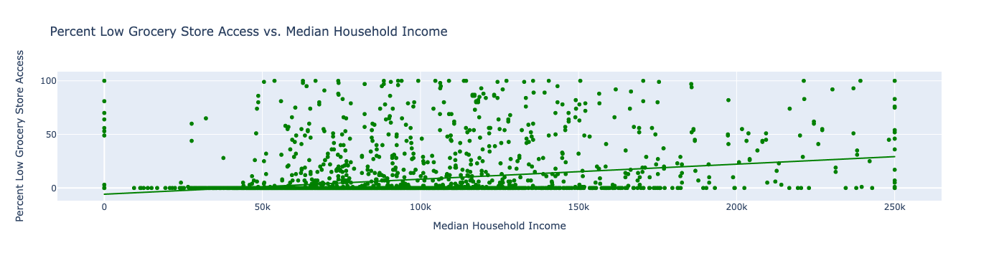

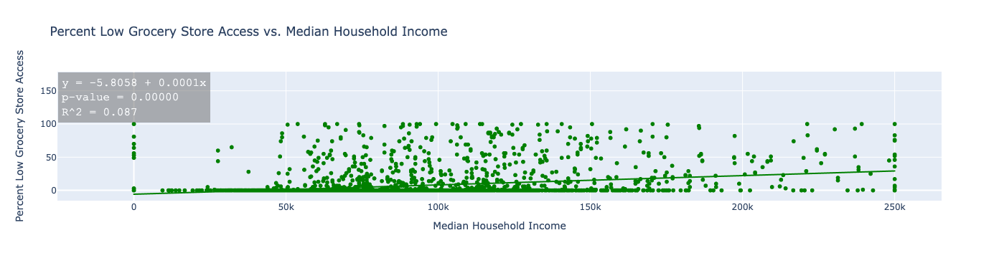

In [16]:
#fit trendline median household income with low grocery store access correlation

fig=px.scatter(new, x= "Median Household Income", y="lowaccess_pct", trendline="ols", color_discrete_sequence = ['green'], labels ={
                "Median Household Income": "Median Household Income",
                "lowaccess_pct": "Percent Low Grocery Store Access"},
            title="Percent Low Grocery Store Access vs. Median Household Income")
fig.show()

# retrieve model estimates
model = px.get_trendline_results(fig)
results = model.iloc[0]["px_fit_results"]
alpha = results.params[0]
beta = results.params[1]
p_beta = results.pvalues[1]
r_squared = results.rsquared

line1 = 'y = ' + str(round(alpha, 4)) + ' + ' + str(round(beta, 4))+'x'
line2 = 'p-value = ' + '{:.5f}'.format(p_beta)
line3 = 'R^2 = ' + str(round(r_squared, 3))
summary = line1 + '<br>' + line2 + '<br>' + line3


fig.add_annotation(
        x=110,
        y=140,
        xref="x",
        yref="y",
        text=summary,
        showarrow=False,
        font=dict(
            family="Courier New, monospace",
            size=16,
            color="#ffffff"
            ),
        align="left",
        arrowhead=2,
        arrowsize=1,
        arrowwidth=2,
        arrowcolor="#636363",
        ax=20,
        ay=-30,
        borderwidth=2,
        borderpad=4,
        bgcolor="rgba(100,100,100, 0.6)",
        opacity=0.8
        )

fig.show()

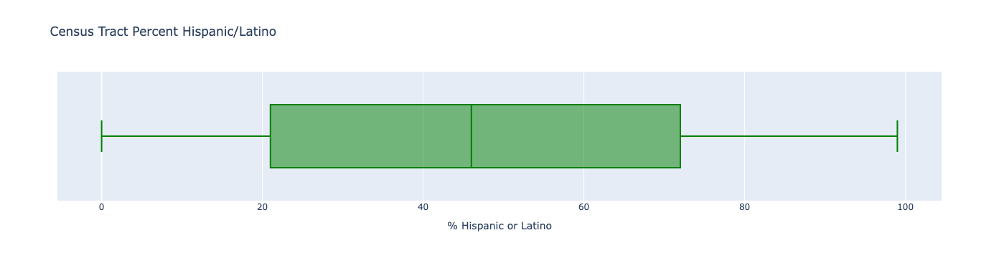

In [17]:
# explore distribution of Hispanic or Latino
px.box(data_frame = new
       ,x = '% Hispanic or Latino', color_discrete_sequence = ['green'],title='Census Tract Percent Hispanic/Latino'
       )

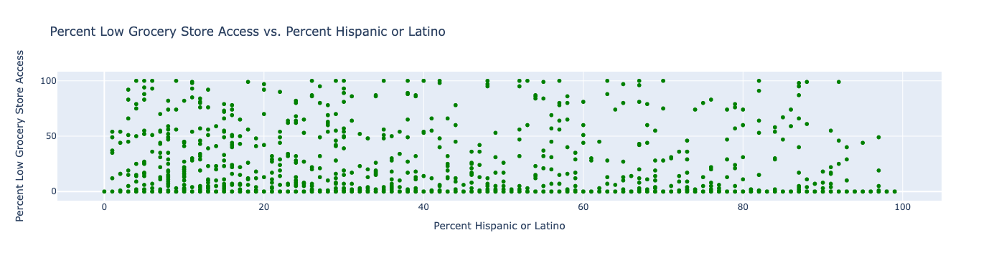

In [18]:
#correlation percent hispanic with low access
px.scatter(new, x="% Hispanic or Latino", y="lowaccess_pct",color_discrete_sequence = ['green'],
            labels ={
                "% Hispanic or Latino": "Percent Hispanic or Latino",
                "lowaccess_pct": "Percent Low Grocery Store Access"},
            title="Percent Low Grocery Store Access vs. Percent Hispanic or Latino")

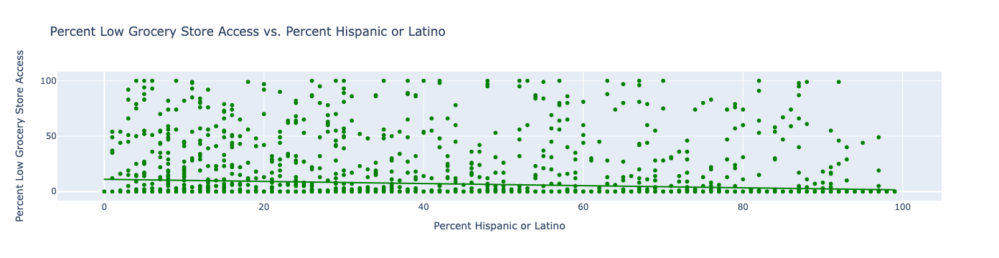

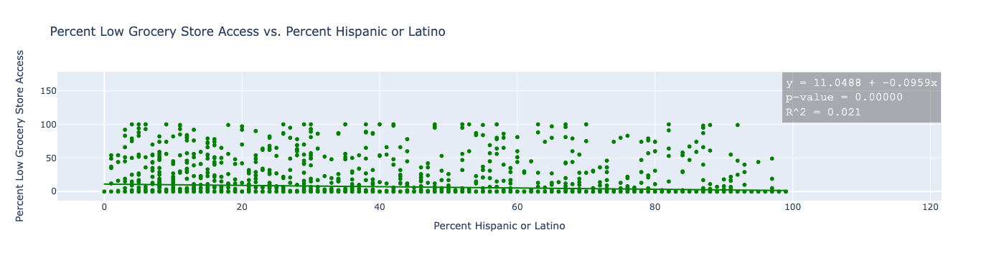

In [19]:
#fit trendline hsipanic/latino percent and low gorcery store access correlation

fig=px.scatter(new, x= "% Hispanic or Latino", y="lowaccess_pct", trendline="ols", color_discrete_sequence = ['green'], labels ={
                "% Hispanic or Latino": "Percent Hispanic or Latino",
                "lowaccess_pct": "Percent Low Grocery Store Access"},
            title="Percent Low Grocery Store Access vs. Percent Hispanic or Latino")
fig.show()

# retrieve model estimates
model = px.get_trendline_results(fig)
results = model.iloc[0]["px_fit_results"]
alpha = results.params[0]
beta = results.params[1]
p_beta = results.pvalues[1]
r_squared = results.rsquared

line1 = 'y = ' + str(round(alpha, 4)) + ' + ' + str(round(beta, 4))+'x'
line2 = 'p-value = ' + '{:.5f}'.format(p_beta)
line3 = 'R^2 = ' + str(round(r_squared, 3))
summary = line1 + '<br>' + line2 + '<br>' + line3


fig.add_annotation(
        x=110,
        y=140,
        xref="x",
        yref="y",
        text=summary,
        showarrow=False,
        font=dict(
            family="Courier New, monospace",
            size=16,
            color="#ffffff"
            ),
        align="left",
        arrowhead=2,
        arrowsize=1,
        arrowwidth=2,
        arrowcolor="#636363",
        ax=20,
        ay=-30,
        borderwidth=2,
        borderpad=4,
        bgcolor="rgba(100,100,100, 0.6)",
        opacity=0.8
        )

fig.show()

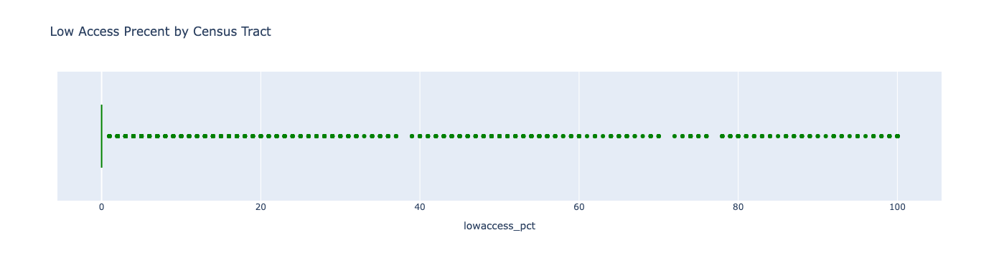

In [21]:
#low access is zero inflated
px.box(data_frame = new
       ,x = 'lowaccess_pct', color_discrete_sequence = ['green'], title='Low Access Precent by Census Tract'
       )

     geoid20_x    CT20   FIPS_census         tract  ShapeSTArea  \
110     532302  532302  6.037532e+09  6.037532e+09  35456321.76   
111     532302  532302  6.037532e+09  6.037532e+09  35456321.76   
112     531302  531302  6.037531e+09  6.037531e+09   9629114.12   
113     531302  531302  6.037531e+09  6.037531e+09   9629114.12   
151     532001  532001  6.037532e+09  6.037532e+09  14571850.54   
...        ...     ...           ...           ...          ...   
4899    700700  700700  6.037701e+09  6.037701e+09  38002136.43   
4900    135205  135205  6.037135e+09  6.037135e+09  28456744.27   
4901    135205  135205  6.037135e+09  6.037135e+09  28456744.27   
4902    139703  139703  6.037140e+09  6.037140e+09  50898904.87   
4903    139703  139703  6.037140e+09  6.037140e+09  50898904.87   

      ShapeSTLength                                         geometry_x  \
110     31690.22581  POLYGON ((-118.1739991724902 34.01740385576181...   
111     31690.22581  POLYGON ((-118.17399917249

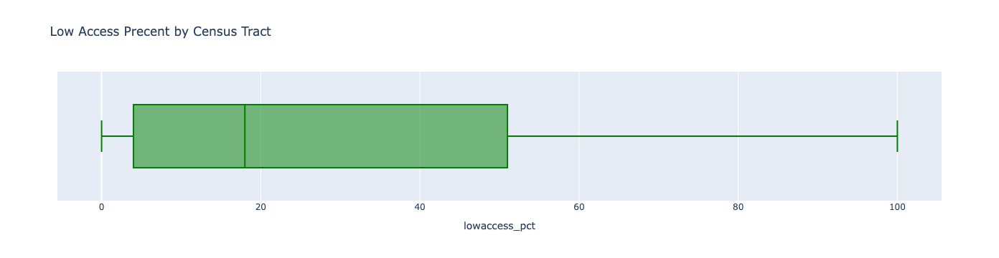

In [66]:
#conditionally delete rows, low access count, is 0 and replot boxplot
new1 = food[food['lowaccess_count'] > 0]
print(new1)
px.box(data_frame = new1
       ,x = 'lowaccess_pct', color_discrete_sequence = ['green'], title='Low Access Precent by Census Tract'
       )

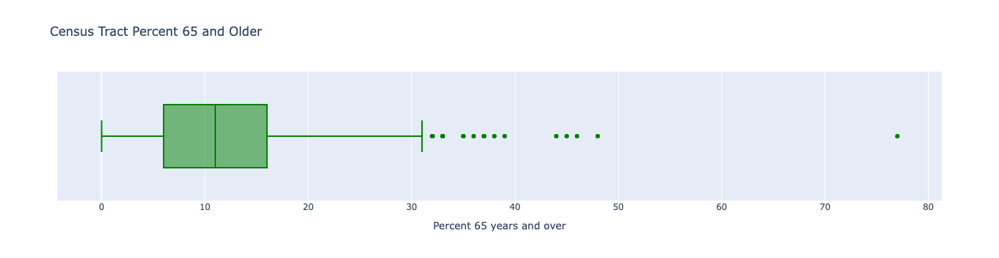

In [23]:
# explore distribution of percent > 65 years old
px.box(data_frame = new
       ,x = 'Percent 65 years and over', color_discrete_sequence = ['green'], title='Census Tract Percent 65 and Older'
       )

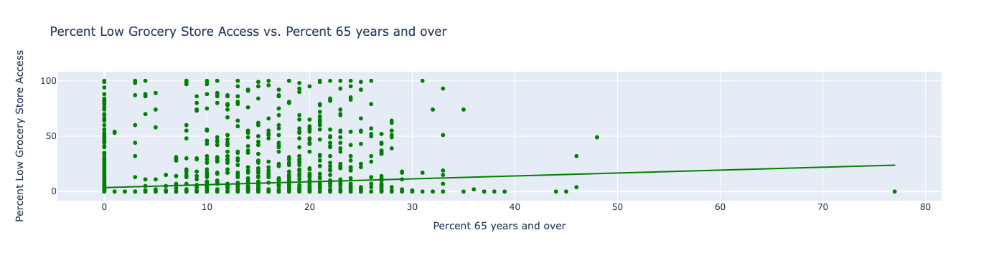

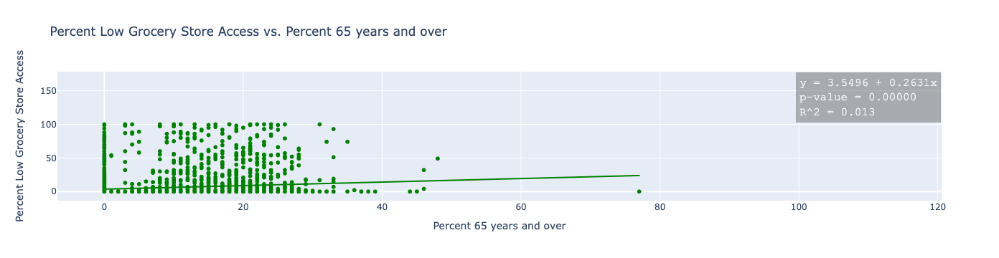

In [24]:
#correlation of percent 65 and over and low access

fig=px.scatter(new, x= "Percent 65 years and over", y="lowaccess_pct", color_discrete_sequence = ['green'], trendline="ols",  labels ={
                "Percent 65 years and over": "Percent 65 years and over",
                "lowaccess_pct": "Percent Low Grocery Store Access"},
            title="Percent Low Grocery Store Access vs. Percent 65 years and over")
fig.show()

# retrieve model estimates
model = px.get_trendline_results(fig)
results = model.iloc[0]["px_fit_results"]
alpha = results.params[0]
beta = results.params[1]
p_beta = results.pvalues[1]
r_squared = results.rsquared

line1 = 'y = ' + str(round(alpha, 4)) + ' + ' + str(round(beta, 4))+'x'
line2 = 'p-value = ' + '{:.5f}'.format(p_beta)
line3 = 'R^2 = ' + str(round(r_squared, 3))
summary = line1 + '<br>' + line2 + '<br>' + line3


fig.add_annotation(
        x=110,
        y=140,
        xref="x",
        yref="y",
        text=summary,
        showarrow=False,
        font=dict(
            family="Courier New, monospace",
            size=16,
            color="#ffffff"
            ),
        align="left",
        arrowhead=2,
        arrowsize=1,
        arrowwidth=2,
        arrowcolor="#636363",
        ax=20,
        ay=-30,
        borderwidth=2,
        borderpad=4,
        bgcolor="rgba(100,100,100, 0.6)",
        opacity=0.8
        )

fig.show()

In [10]:
#Load in tract shape file
tracts = gpd.read_file('Data/tl_2020_06_tract (1).shp')

ERROR 1: PROJ: proj_create_from_database: Open of /opt/conda/share/proj failed


In [11]:
#make geoid for matching
tracts['geoid20_x']=tracts.TRACTCE

In [12]:
tracts['COUNTYFP'].unique()

array(['029', '047', '085', '005', '019', '073', '037', '071', '033',
       '053', '083', '111', '013', '035', '039', '065', '095', '103',
       '057', '001', '113', '025', '043', '115', '109', '101', '041',
       '009', '099', '079', '017', '027', '075', '023', '045', '087',
       '061', '097', '081', '059', '089', '077', '105', '093', '055',
       '067', '007', '011', '049', '069', '015', '107', '021', '063',
       '031', '051', '003', '091'], dtype=object)

In [16]:
#filterto LA County census tracts
latracts = tracts.query("COUNTYFP == '037'")

In [17]:
#merge the data
tracts_census= latracts.merge(new,on="geoid20_x")

In [18]:
#check that it is a geodataframe, not a dataframe
tracts_census.info(verbose=True,show_counts=True)

<class 'geopandas.geodataframe.GeoDataFrame'>
RangeIndex: 4902 entries, 0 to 4901
Data columns (total 41 columns):
 #   Column                             Non-Null Count  Dtype   
---  ------                             --------------  -----   
 0   STATEFP                            4902 non-null   object  
 1   COUNTYFP                           4902 non-null   object  
 2   TRACTCE                            4902 non-null   object  
 3   GEOID                              4902 non-null   object  
 4   NAME                               4902 non-null   object  
 5   NAMELSAD                           4902 non-null   object  
 6   MTFCC                              4902 non-null   object  
 7   FUNCSTAT                           4902 non-null   object  
 8   ALAND                              4902 non-null   int64   
 9   AWATER                             4902 non-null   int64   
 10  INTPTLAT                           4902 non-null   object  
 11  INTPTLON                           

# Start mapping variables

In [19]:
# Export DataFrame to CSV
tracts_census.to_csv('merged_data_jf.csv', index=False)

In [20]:
import matplotlib.pyplot as plt
import numpy as np
import contextily as cx

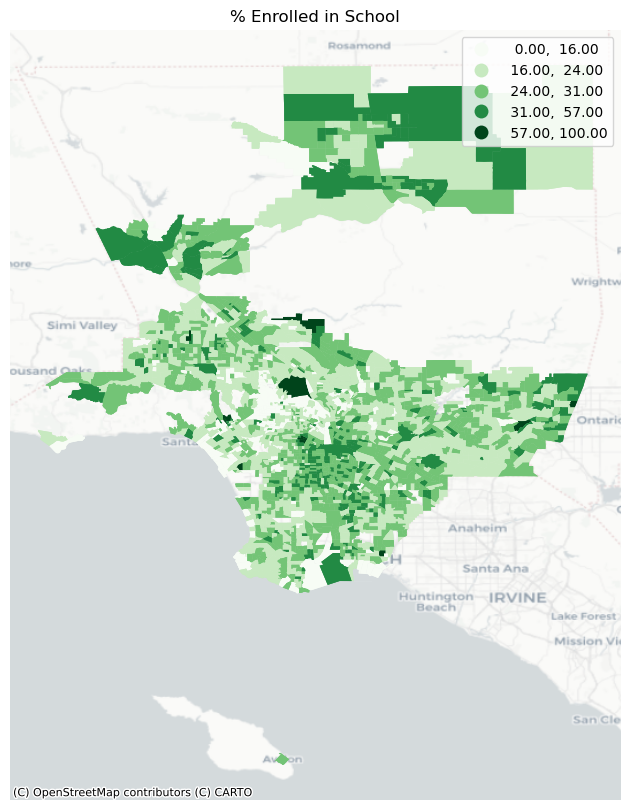

In [59]:
# % enrolled in school
ax = tracts_census.plot(figsize=(12,10),
                   column='% Enrolled in School',
                   legend=True,
                   scheme='NaturalBreaks',
                    cmap='Greens')
ax.set_axis_off()
ax.set_title('% Enrolled in School')
cx.add_basemap(ax,crs=4326,
               source=cx.providers.CartoDB.Positron)
plt.savefig('% Enrolled in School')

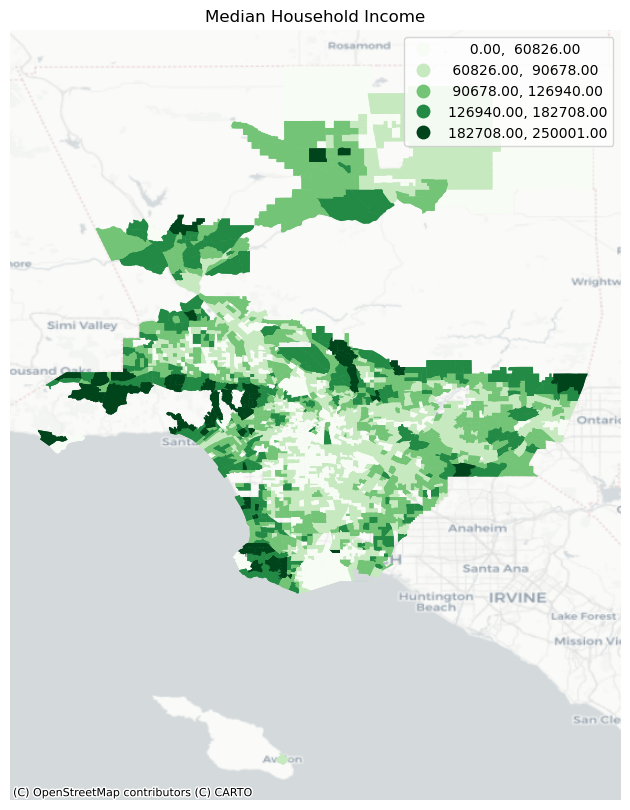

In [34]:
# median income
ax = tracts_census.plot(figsize=(12,10),
                   column='Median Household Income',
                   legend=True,
                   scheme='NaturalBreaks',
                    cmap='Greens')
ax.set_axis_off()
ax.set_title('Median Household Income')
cx.add_basemap(ax,crs=4326,
               source=cx.providers.CartoDB.Positron)
plt.savefig('Median Household Income')

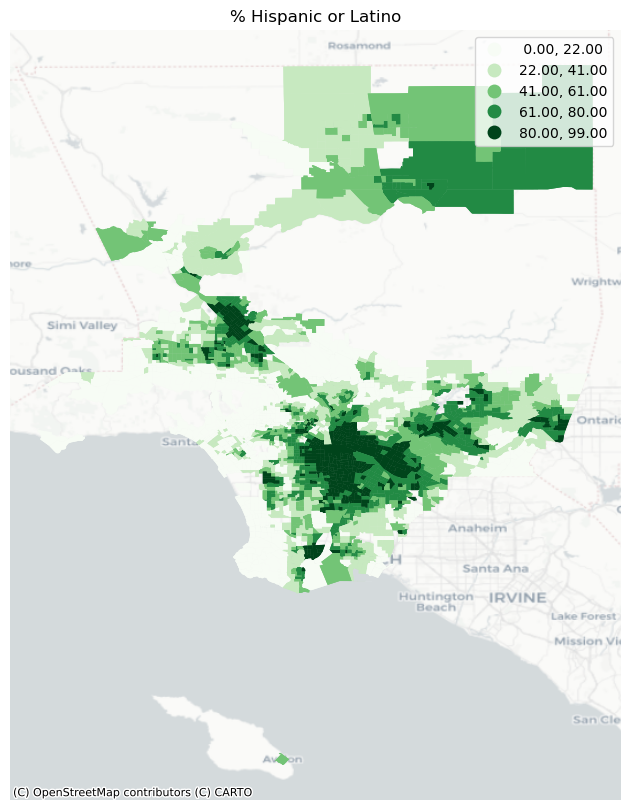

In [35]:
# % hispanic or latino
ax = tracts_census.plot(figsize=(12,10),
                   column='% Hispanic or Latino',
                   legend=True,
                   scheme='NaturalBreaks',
                    cmap='Greens')
ax.set_axis_off()
ax.set_title('% Hispanic or Latino')
cx.add_basemap(ax,crs=4326,
               source=cx.providers.CartoDB.Positron)
plt.savefig('% Hispanic or Latino.png')

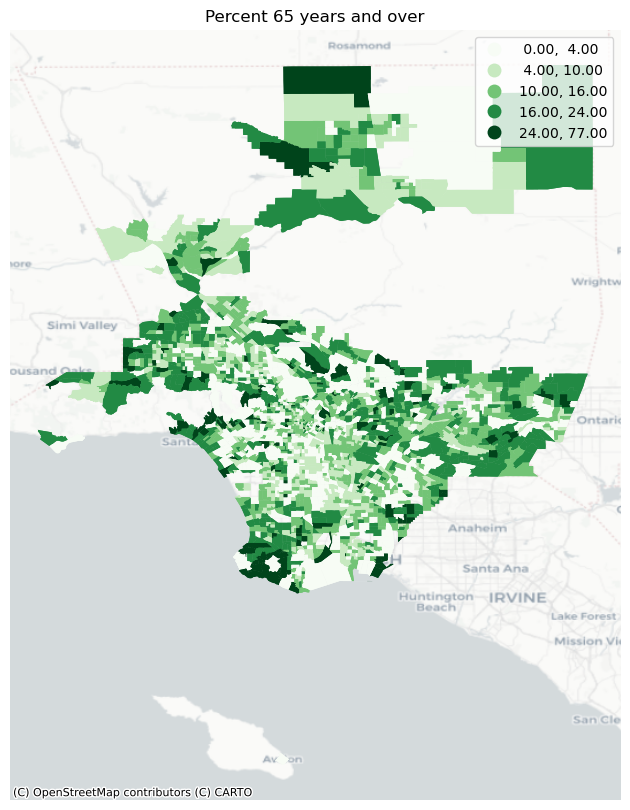

In [19]:
#% 65 and above
ax = tracts_census.plot(figsize=(12,10),
                   column='Percent 65 years and over',
                   legend=True,
                   scheme='NaturalBreaks',
                    cmap='Greens')
ax.set_axis_off()
ax.set_title('Percent 65 years and over')
cx.add_basemap(ax,crs=4326,
               source=cx.providers.CartoDB.Positron)
plt.savefig('% 65 years and over.png')

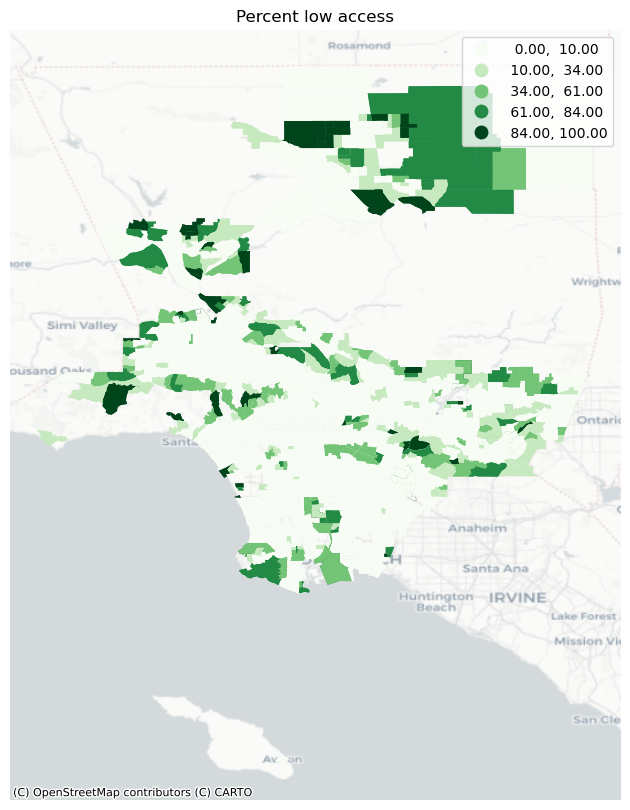

In [37]:
#% low access
ax = tracts_census.plot(figsize=(12,10),
                   column='lowaccess_pct',
                   legend=True,
                   scheme='NaturalBreaks',
                    cmap='Greens')
ax.set_axis_off()
ax.set_title('Percent low access')
cx.add_basemap(ax,crs=4326,
               source=cx.providers.CartoDB.Positron)
plt.savefig('lowaccess_pct and over.png')

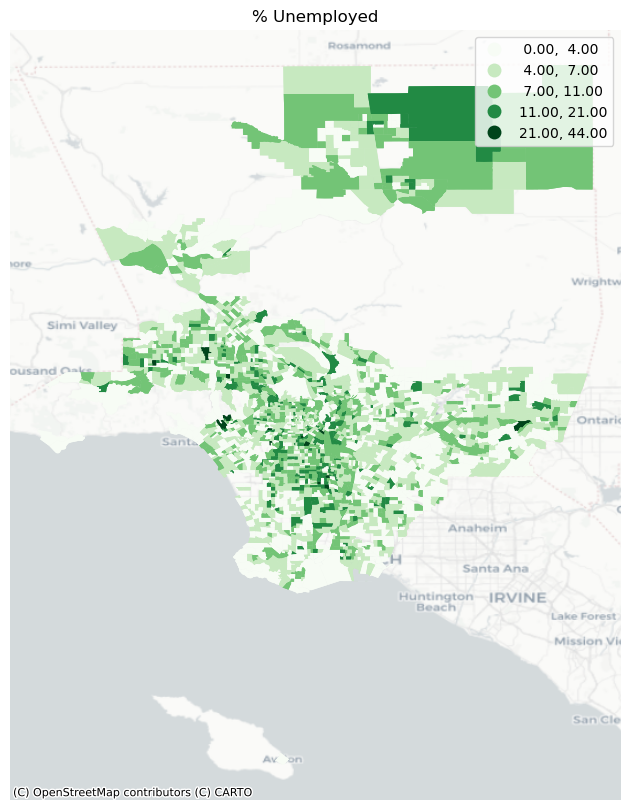

In [55]:
#% unemployed
ax = tracts_census.plot(figsize=(12,10),
                   column='% Unemployed',
                   legend=True,
                   scheme='NaturalBreaks',
                    cmap='Greens')
ax.set_axis_off()
ax.set_title('% Unemployed')
cx.add_basemap(ax,crs=4326,
               source=cx.providers.CartoDB.Positron)
plt.savefig('% Unemployed.png')

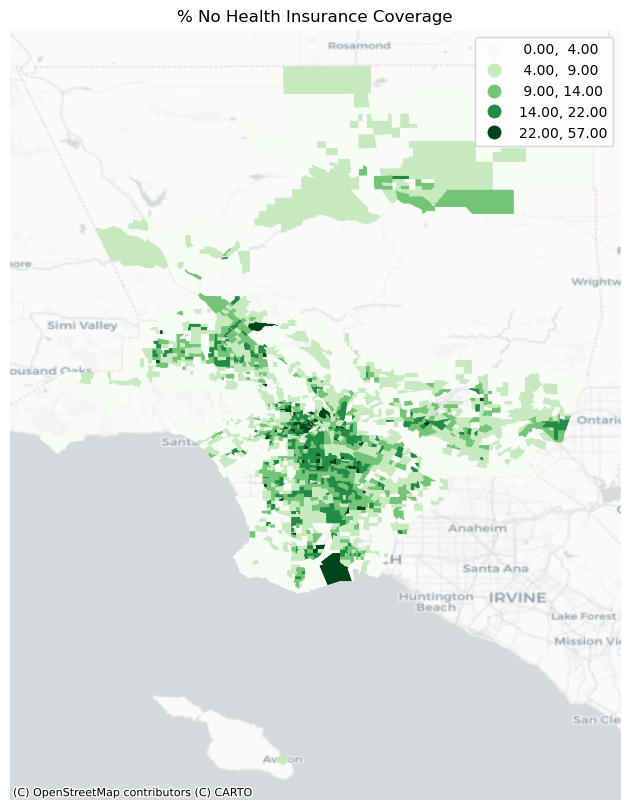

In [49]:
#% No Health Insurance Coverage
ax = tracts_census.plot(figsize=(12,10),
                   column='% No Health Insurance Coverage',
                   legend=True,
                   scheme='NaturalBreaks',
                    cmap='Greens')
ax.set_axis_off()
ax.set_title('% No Health Insurance Coverage')
cx.add_basemap(ax,crs=4326,
               source=cx.providers.CartoDB.Positron)
plt.savefig('% No Health Insurance Coverage.png')


# Create Food Insecurity Index variable

In [21]:
import mapclassify

In [22]:
# Create a Natural Breaks classifier
classifier = mapclassify.NaturalBreaks.make(k=5)

In [23]:
# make index for percent over 65
tracts_census['age_pct_score'] = tracts_census[['Percent 65 years and over']].apply(classifier)

tracts_census[['Percent 65 years and over', 'age_pct_score']].head()

,Percent 65 years and over,age_pct_score
0,23,3
1,23,3
2,0,0
3,0,0
4,14,2


In [24]:
#make index for percent hispanic/latino
tracts_census['hisp_pct_score'] = tracts_census[['% Hispanic or Latino']].apply(classifier)

tracts_census[['% Hispanic or Latino', 'hisp_pct_score']].head()

,% Hispanic or Latino,hisp_pct_score
0,6,0
1,6,0
2,19,0
3,19,0
4,20,0


In [25]:
#make index for unemployment 
tracts_census['emp_pct_score'] = tracts_census[['% Unemployed']].apply(classifier)

tracts_census[['% Unemployed', 'emp_pct_score']].head()


,% Unemployed,emp_pct_score
0,2,0
1,2,0
2,7,2
3,7,2
4,5,1


In [26]:
#make index of the prior 3 indices
tracts_census['priority_index'] = tracts_census['age_pct_score']+tracts_census['hisp_pct_score']+tracts_census['emp_pct_score']

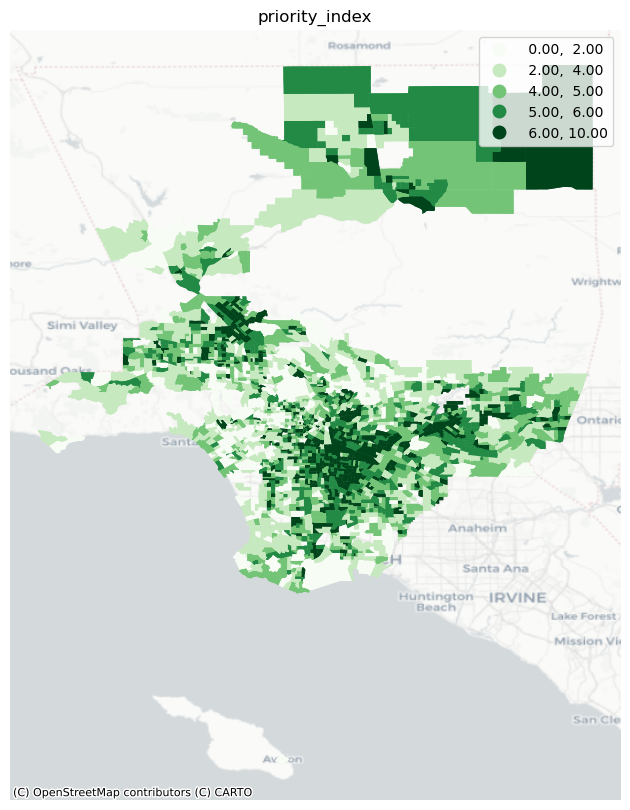

In [27]:
#Map FI index
ax = tracts_census.plot(figsize=(12,10),
                   column='priority_index',
                   legend=True,
                   scheme='NaturalBreaks',
                    cmap='Greens')
ax.set_axis_off()
ax.set_title('priority_index')
cx.add_basemap(ax,crs=4326,
               source=cx.providers.CartoDB.Positron)
plt.savefig('priority_index.png')

# Now I will look at barchart of Independent vars with the index

In [28]:
import matplotlib.pyplot as plt

In [67]:
#find the number of census tracts in each FI group
grouped=tracts_census.groupby(by='priority_index').size()
grouped

priority_index
0       74
1      194
2      344
3      558
4      864
5     1058
6      908
7      598
8      244
9       56
10       4
dtype: int64

# now will examine the average of variables by FI index

In [72]:
tracts_census.groupby(['priority_index'])['% Not a Citizen'].mean()

priority_index
0      8.270270
1      9.059406
2      9.205263
3     11.116608
4     12.251082
5     15.932950
6     17.694013
7     20.751799
8     21.723810
9     20.523810
10    18.000000
Name: % Not a Citizen, dtype: float64

In [73]:
tracts_census.groupby(['priority_index'])['% No Health Insurance Coverage'].mean()

priority_index
0      2.540541
1      4.643564
2      4.868421
3      6.346290
4      6.777056
5      9.273946
6     10.784922
7     12.165468
8     13.352381
9     13.238095
10     8.000000
Name: % No Health Insurance Coverage, dtype: float64

In [74]:
tracts_census.groupby(['priority_index'])['Median Household Income'].mean()

priority_index
0     116301.108108
1     123176.227723
2     111790.121053
3     102307.618375
4      96429.385281
5      83165.854406
6      75325.898004
7      65339.010791
8      60955.152381
9      58768.476190
10     47431.000000
Name: Median Household Income, dtype: float64

In [75]:
tracts_census.groupby(['priority_index'])['% Enrolled in School'].mean()


priority_index
0     19.540541
1     20.861386
2     24.605263
3     24.498233
4     23.744589
5     25.206897
6     25.676275
7     26.435252
8     26.571429
9     25.000000
10    31.000000
Name: % Enrolled in School, dtype: float64

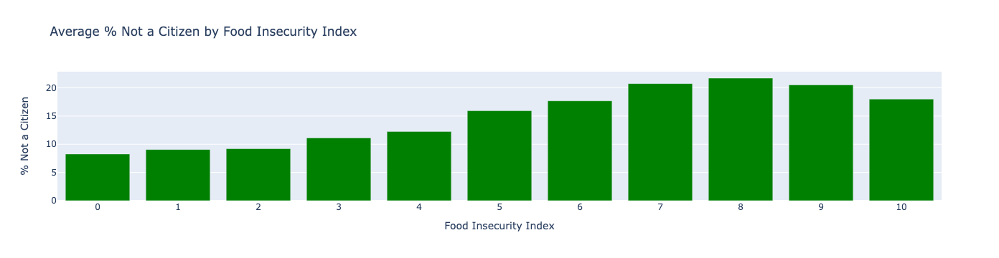

In [65]:
#make bar chart of % non citizen by FI group

bar=[['0', 8.270270], ['1', 9.059406], ['2',9.205263], ['3', 11.116608], ['4',12.251082], ['5', 15.932950], ['6', 17.694013], ['7', 20.751799], ['8',21.723810], ['9', 20.523810],['10', 18]]

df3 = pd.DataFrame(bar, columns=['Food Insecurity Index', '% Not a Citizen'])
     
fig = px.bar(df3, x='Food Insecurity Index', y='% Not a Citizen', color_discrete_sequence =['green']*len(df),
            title="Average % Not a Citizen by Food Insecurity Index")
fig.show()




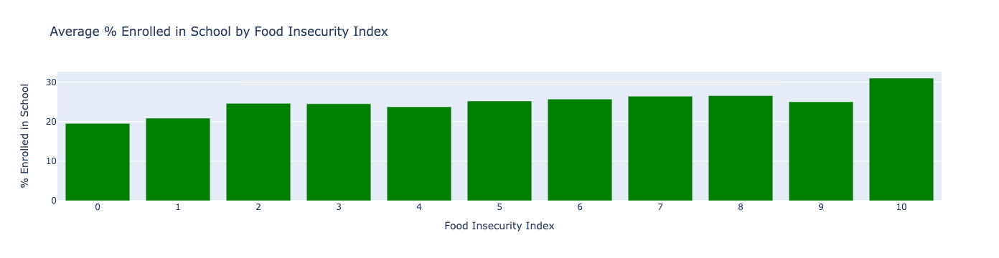

In [62]:
#make bar chart of % enrolled in school by FI group

bar=[['0',  19.540541], ['1', 20.861386], ['2',24.605263], ['3', 24.498233], ['4',23.744589], ['5', 25.206897], ['6', 25.676275], ['7', 26.435252], ['8',26.571429], ['9', 25],['10', 31]]

df2 = pd.DataFrame(bar, columns=['Food Insecurity Index', '% Enrolled in School'])
     
fig = px.bar(df2, x='Food Insecurity Index', y='% Enrolled in School', color_discrete_sequence =['green']*len(df),
            title="Average % Enrolled in School by Food Insecurity Index")
fig.show()



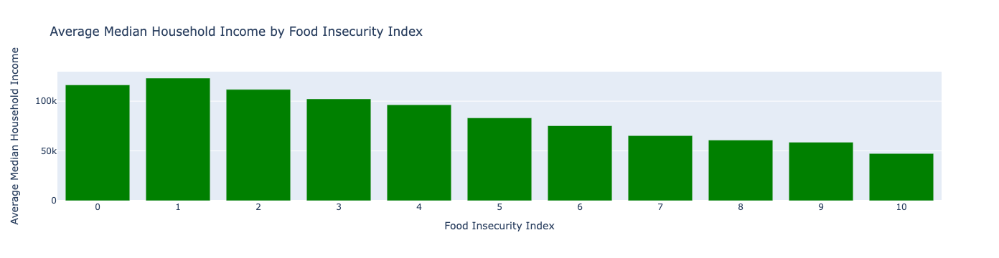

In [58]:
#make bar chart of median household income and FI by FI group

bar=[['0', 116301], ['1', 123176], ['2',111790], ['3',102307], ['4',96429], ['5', 83165], ['6', 75325], ['7', 65339], ['8',60955], ['9', 58768],['10', 47431]]

df = pd.DataFrame(bar, columns=['Food Insecurity Index', 'Average Median Household Income'])
     
fig = px.bar(df, x='Food Insecurity Index', y='Average Median Household Income', color_discrete_sequence =['green']*len(df),
            title="Average Median Household Income by Food Insecurity Index")
fig.show()


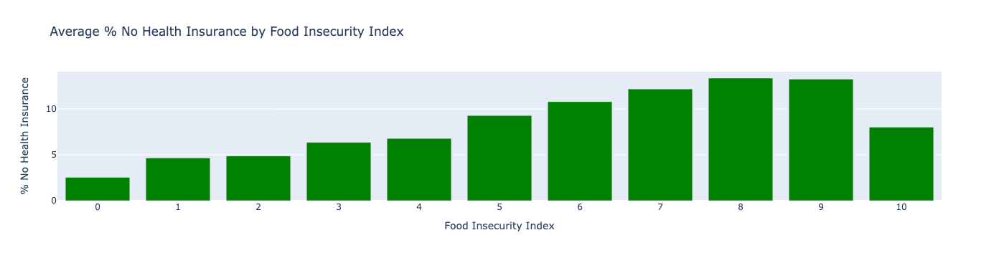

In [63]:
#make bar chart of % no health insurance and FI by FI group

bar=[['0', 2.540541], ['1', 4.643564], ['2',4.868421], ['3', 6.346290], ['4',6.777056], ['5', 9.273946], ['6', 10.784922], ['7', 12.165468], ['8',13.352381], ['9', 13.238095],['10', 8]]

df1 = pd.DataFrame(bar, columns=['Food Insecurity Index', '% No Health Insurance'])
     
fig = px.bar(df1, x='Food Insecurity Index', y='% No Health Insurance', color_discrete_sequence =['green']*len(df),
            title="Average % No Health Insurance by Food Insecurity Index")
fig.show()


